# Example end-to-end `gaia_clustering` pipeline

This notebook runs the full membership and velocity-dispersion pipeline on the cluster **NGC 6231**. The pipeline resolves it with SIMBAD, cones Gaia DR3 around that position, separates a compact component from the field with extreme deconvolution, and infers the members' velocity Gaussian.

The steps below follow the same order as the science:

1. Resolve the name and download a broad Gaia neighbourhood with `query_association`.
2. Tighten centres, radii, and the parallax range with `refine_search`, then inspect with `plot_query` before clustering.
3. Membership: association vs field, then spatial lobes among members.
4. Hierarchical Bayesian velocity dispersion of the members.
5. Sky, corner, 3D traceback, and velocity plots; save products.

**Gaia radial velocities are never used.** Independently measured RVs can be attached; this notebook does not, so the velocity fit is 2D (tangential).

The first run needs the network (Sesame + Gaia TAP). Repeats reuse the package TAP cache under `~/.cache/gaia_clustering`. Extreme deconvolution is seconds; NUTS sampling is the slow step (a few minutes with the notebook settings below).

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2


In [2]:

from pathlib import Path

import pandas as pd
from IPython.display import display

from gaia_clustering import analyze_association, query_association

pd.set_option("display.max_columns", 20)
pd.set_option("display.width", 120)

output_dir = Path("results") / "algol"
print(f"output: {output_dir.resolve()}")

output: /home/rwillcox/astro/gaia_clustering/examples/results/algol


## 1. Query Gaia, refine the cuts, and inspect

`query_association` is the first, broad search: it resolves the name and downloads a Gaia cone at that position with the requested radius, $G$ limit, and optional parallax range. `refine_search` then tightens centres and radii (sky and proper motion) and the parallax range in memory — no new TAP query. `plot_query` only draws: the refined cone and parallax range appear as red circles and lines, and colour encodes which cuts each star passes.

SIMBAD coordinates centre the TAP cone. `refine_search(position_center=...)` can move the selected cone afterwards; a red X still marks the name-resolved default.

Algol is **not** a named OB association. The compact Gaussian later on is whatever extreme deconvolution finds in this neighbourhood — useful as a worked example of the API, not a claim that Algol sits in a bound group.

In [3]:
# Gaia query 
# Can crash if parameters allow for too many stars, 
# but should be broad enough to not lose any members
query = query_association(
    "NGC 6231",
    position_radius_arcmin=30,
    g_max=16,
    parallax_range=(0.4, .7),
    top=50000,
)


Resolving 'NGC 6231' and querying Gaia DR3...
  resolved 'NGC 6231' → NGC  6231 (group)
  NGC  6231 (group) → 2954 Gaia stars in a 30.0 arcmin cone


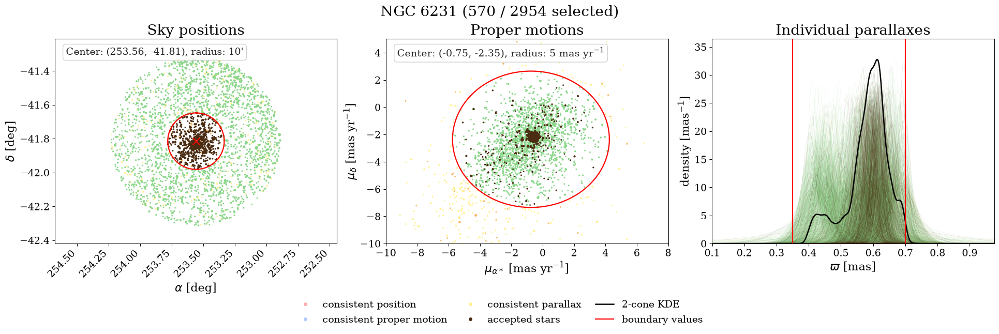

In [4]:
# This step can/should be rerun repeatedly to do a preliminary by-eye 
# refinement of the search parameters

query.reset_search()
query.refine_search(
    #position_center=(253.56, -41.81),
    position_radius_arcmin=10,
    #pm_center=(-0.75, -2.35),
    pm_radius=5,
    parallax_range=(.35, .7),
)

fig, axes = query.plot_query(
    #ra_range=(252.50, 254.50), 
    #dec_range=(-42.4, -41.4),
    pmra_range=(-10, 8),
    pmdec_range=(-10, 5), 
    #parallax_range=(0.1, 0.9),
    #ms=5,
    #parallax_alpha=0.3,
    kde_bandwidth=0.01,
)

# Points with primary colors pass a single constency test.
# Points with secondary colors pass the two tests corresponding to their color mix
# Points that pass all three tests are dark brown


## 2. The Gaia neighbourhood

`query.query` is the Sesame / TAP metadata. `query.catalog` is the astrometry that will be clustered (no Gaia RV columns). `query.extended` is the downloaded TAP sample shown in `plot_query`. If the cone looks too small or large, call `query.refine_search(position_radius_arcmin=...)` (up to the downloaded radius) and `plot_query` again — no new TAP query.

In [5]:
info = pd.Series(query.query)
display(info.to_frame("value"))

print(
    f"\n{len(query.catalog)} selected / {len(query.extended)} downloaded  |  "
    f"kind={query.query.get('kind')!r}  |  "
    f"SIMBAD={query.query.get('simbad_main_id')!r}"
)

query.catalog[
    ["designation", "ra", "dec", "parallax", "pmra", "pmdec", "phot_g_mean_mag", "ruwe"]
].head()

,value
input_name,NGC 6231
simbad_main_id,NGC 6231
simbad_ra,253.56
simbad_dec,-41.814722
otype,OpC
kind,group
gaia_source_id,None
status,no_gaia_id
center_ra,253.56
center_dec,-41.814722



570 selected / 2954 downloaded  |  kind='group'  |  SIMBAD='NGC  6231'


,designation,ra,dec,parallax,pmra,pmdec,phot_g_mean_mag,ruwe
65,Gaia DR3 5966502012789996928,253.449914,-41.917892,0.504548,-0.604168,-2.223197,12.523125,1.280508
66,Gaia DR3 5966502631265655424,253.595020,-41.937389,0.544485,-2.972467,-0.347468,15.480863,1.199057
67,Gaia DR3 5966503219691591168,253.483116,-41.929379,0.598287,-0.465654,-2.197726,14.431807,1.090456
68,Gaia DR3 5966503254051325440,253.499495,-41.922871,0.523863,0.918486,-0.146061,15.778545,0.957722
69,Gaia DR3 5966503597637908224,253.483477,-41.877747,0.417159,0.779794,-2.083819,15.392246,1.008011


## 3. Membership (extreme deconvolution)

Once the cone and parallax cuts look reasonable, pass the `GaiaQuery` to `analyze_association`. Each star is compared to mixture component $k$ with covariance $T_k + S_i$ (Bovy, Hogg & Roweis 2011), so measurement noise is deconvolved rather than ignored.

1. **Association vs field** in 6D phase space: one compact Gaussian plus a wide field. `member_prob` is $1$ minus the field responsibility.
2. **Spatial structure** among stars above the probability threshold: $K = 1,2,3$ compared by BIC. `cluster_id` is $-1$ for field and $0, 1, \ldots$ for spatial lobes.

Stars without RV still constrain position and tangential velocity; unused line-of-sight velocity is given an uninformative uncertainty so it does not pull the fit.

Around a field star like Algol the compact component may claim most or all of the cone — that is a result, not a pipeline failure. Named associations (for example Cyg OB3) typically show a clearer member/field split.

NUTS settings below are lighter than the library defaults (`draws=1000`, `chains=4`) so the notebook stays interactive. Increase them for a publication-quality posterior.


In [6]:
# When preferred_K > 1, velocity_cluster_id is required (matches table cluster_id;
# summary colorbars are labelled cluster_id + 1). Inspect plot_summary first if unsure.
result = analyze_association(
    query,
    membership_probability_threshold=0.9,
    infer_velocity=True,
    velocity_cluster_id=0,
    velocity_draws=400,
    velocity_tune=400,
    velocity_chains=2,
    velocity_cores=2,
    random_state=0,
)
result.summary()


Using GaiaQuery 'NGC 6231': 570 selected stars (2954 downloaded)
Clustering 570 stars with extreme deconvolution...
  structure: 2 clusters (multi-lobe); members / field = 570 / 0
  stars contributing RV: 0
Inferring 2D tangential velocity dispersion (570 members)...


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [Venv, Senv, v_true_z, d^3]


Output()

/home/rwillcox/miniconda3/envs/cyg_ob3/lib/python3.14/site-packages/pymc/step_methods/hmc/quadpotential.py:321: RuntimeWarning: overflow encountered in dot
  return 0.5 * np.dot(x, v_out)


Sampling 2 chains for 400 tune and 400 draw iterations (800 + 800 draws total) took 115 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


  σ_1D = 10.10 km/s  (16/50/84% = 9.84 / 10.07 / 10.37)
  component σ [km/s] = [ 9.69 10.49]


{'name': 'NGC 6231',
 'kind': 'group',
 'n_catalog': 570,
 'n_members': 570,
 'n_field': 0,
 'n_with_rv': 0,
 'membership_threshold': 0.9,
 'structure': '2 clusters (multi-lobe)',
 'preferred_K': 2,
 'n_vel': 2,
 'velocity_mean_kms': [-6.834742627795567, -20.19934089911406],
 'velocity_std_kms': [9.69249817350347, 10.48771246299057],
 'sigma_1d_kms': 10.100029766303981,
 'sigma_1d_quantiles_kms': [9.835955669161718,
  10.073674364940818,
  10.371713218072777],
 'velocity_corr': [[1.0, 0.44161862933665946], [0.44161862933665946, 1.0]]}

In [7]:
tab = result.table
print(
    f"members / field = {result.n_members} / {result.n_field}  "
    f"(threshold P(member) ≥ {result.membership_threshold})"
)
print(f"spatial structure: {result.membership['best'].get('structure')}")
print(f"stars with independent RV: {int(result.membership['use_rv'].sum())}")

cols = [c for c in ("designation", "ra", "dec", "parallax", "pmra", "pmdec",
                    "member_prob", "cluster_id", "is_member", "use_rv") if c in tab.columns]
tab[cols].sort_values("member_prob", ascending=False).head(12)

members / field = 570 / 0  (threshold P(member) ≥ 0.9)
spatial structure: 2 clusters (multi-lobe)
stars with independent RV: 0


,designation,ra,dec,parallax,pmra,pmdec,member_prob,cluster_id,is_member,use_rv
1803,Gaia DR3 5966509335725032704,253.642573,-41.820364,0.402145,-1.462744,-3.891063,1.0,1,True,False
1655,Gaia DR3 5966509743739471232,253.543384,-41.853948,0.419707,-1.713756,-3.339817,1.0,1,True,False
1443,Gaia DR3 5966509056544742144,253.580799,-41.845112,0.409002,-3.104160,-4.050092,1.0,1,True,False
1374,Gaia DR3 5966509576243253376,253.593543,-41.797904,0.435348,-1.297990,-3.219942,1.0,1,True,False
266,Gaia DR3 5966503868224196608,253.529760,-41.856477,0.476794,-1.147081,-3.510458,1.0,1,True,False
1793,Gaia DR3 5966507823896520832,253.675980,-41.823472,0.401370,-0.755595,-2.934465,1.0,1,True,False
1194,Gaia DR3 5966509267005560960,253.604364,-41.837935,0.415717,-0.417062,-2.438876,1.0,1,True,False
1650,Gaia DR3 5966509125264205568,253.566854,-41.840078,0.513773,-0.460746,-2.374334,1.0,0,True,False
1688,Gaia DR3 5966509541870324480,253.580815,-41.819009,0.458458,-0.597193,-2.267221,1.0,1,True,False
1506,Gaia DR3 5966510057266594944,253.509658,-41.806643,0.402443,-0.663998,-2.973647,1.0,1,True,False


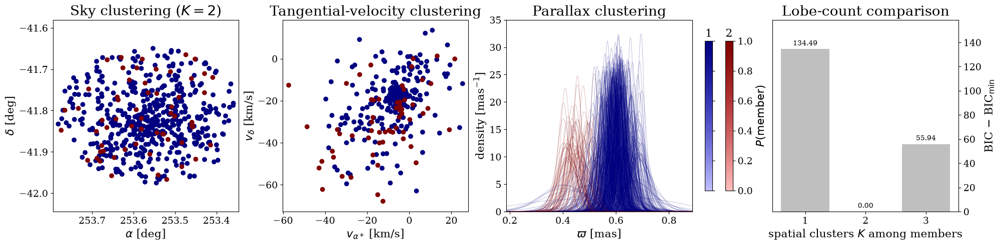

In [18]:
fig, _ = result.plot_summary()

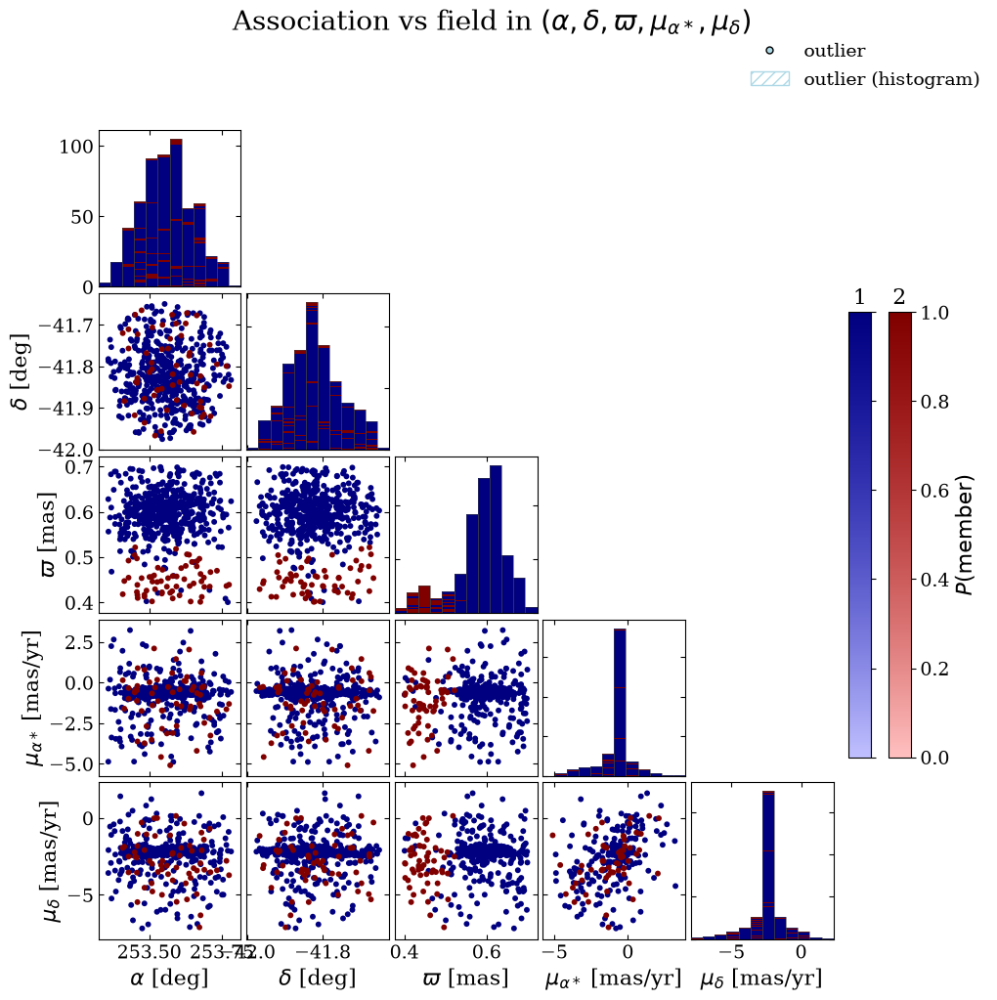

In [17]:
fig = result.plot_corner()

## 4. Velocity dispersion

Members are fit with a hierarchical Bayesian Gaussian (PyMC / NUTS):

- population velocities $(v_\alpha, v_\delta[, v_r]) \sim \mathcal{N}(\mu, \Sigma)$
- latent distance with $p(d) \propto d^2$; $\varpi = 1/d$
- predicted proper motions $\mu_{\alpha,\delta} = v_{\alpha,\delta}\,\varpi / 4.74047$, compared to Gaia $(\varpi, \mu_\alpha, \mu_\delta)$

With no independent RVs the population is 2D. The scalar summary is $\sigma_{1\mathrm{D}} = \sqrt{\mathrm{mean}(\sigma_i^2)}$. This is **today's** scatter (including expansion or streaming), not necessarily birth-time jitter.

In [10]:
if result.velocity is None:
    print("Velocity inference was skipped (too few members or infer_velocity=False).")
else:
    vel = result.velocity
    lo, med, hi = vel["sigma_1d_quantiles"]
    print(f"velocity dimensions: {vel['n_vel']}D")
    print(f"members in the fit:  {vel['n_stars']}")
    print(f"μ  [km/s] = {vel['mean']}")
    print(f"σ  [km/s] = {vel['std']}")
    print(f"σ_1D = {vel['sigma_1d']:.2f} km/s   (16/50/84% = {lo:.2f} / {med:.2f} / {hi:.2f})")
    display(vel["summary"].head(20) if "summary" in vel else vel["corr"])

velocity dimensions: 2D
members in the fit:  570
μ  [km/s] = [ -6.83474263 -20.1993409 ]
σ  [km/s] = [ 9.69249817 10.48771246]
σ_1D = 10.10 km/s   (16/50/84% = 9.84 / 10.07 / 10.37)


,mean,sd,eti95_lb,eti95_ub,ess_bulk,ess_tail,r_hat,mcse_mean,mcse_sd
Venv[0],-6.83474,0.32273,-7.59343,-6.41674,3.17166,5.80815,1.76983,0.18689,0.11920
Venv[1],-20.19934,0.47941,-20.96019,-19.05742,6.21679,20.87623,1.29199,0.18492,0.13292
"cov[0, 0]",94.03736,5.96444,85.05030,107.50642,35.27442,42.41248,1.05208,1.06234,0.80686
"cov[0, 1]",44.97996,5.02028,35.92336,56.24420,32.44109,61.47403,1.01089,0.89600,0.62216
"cov[1, 0]",44.97996,5.02028,35.92336,56.24420,32.44109,61.47403,1.01089,0.89600,0.62216
"cov[1, 1]",110.12687,7.74796,96.89450,126.79528,32.32119,93.06477,1.00807,1.35602,0.97857
"corr[0, 0]",1.00000,0.00000,1.00000,1.00000,800.00000,800.00000,NaN,0.00000,NaN
"corr[0, 1]",0.44162,0.03439,0.36972,0.50571,40.77114,67.29714,1.00593,0.00539,0.00378
"corr[1, 0]",0.44162,0.03439,0.36972,0.50571,40.77114,67.29714,1.00593,0.00539,0.00378
"corr[1, 1]",1.00000,0.00000,1.00000,1.00000,663.81461,618.89681,1.00656,0.00000,0.00000


In [11]:
if result.velocity is None:
    print("No velocity figure: inference was skipped.")
else:
    display(result.plot_velocity())

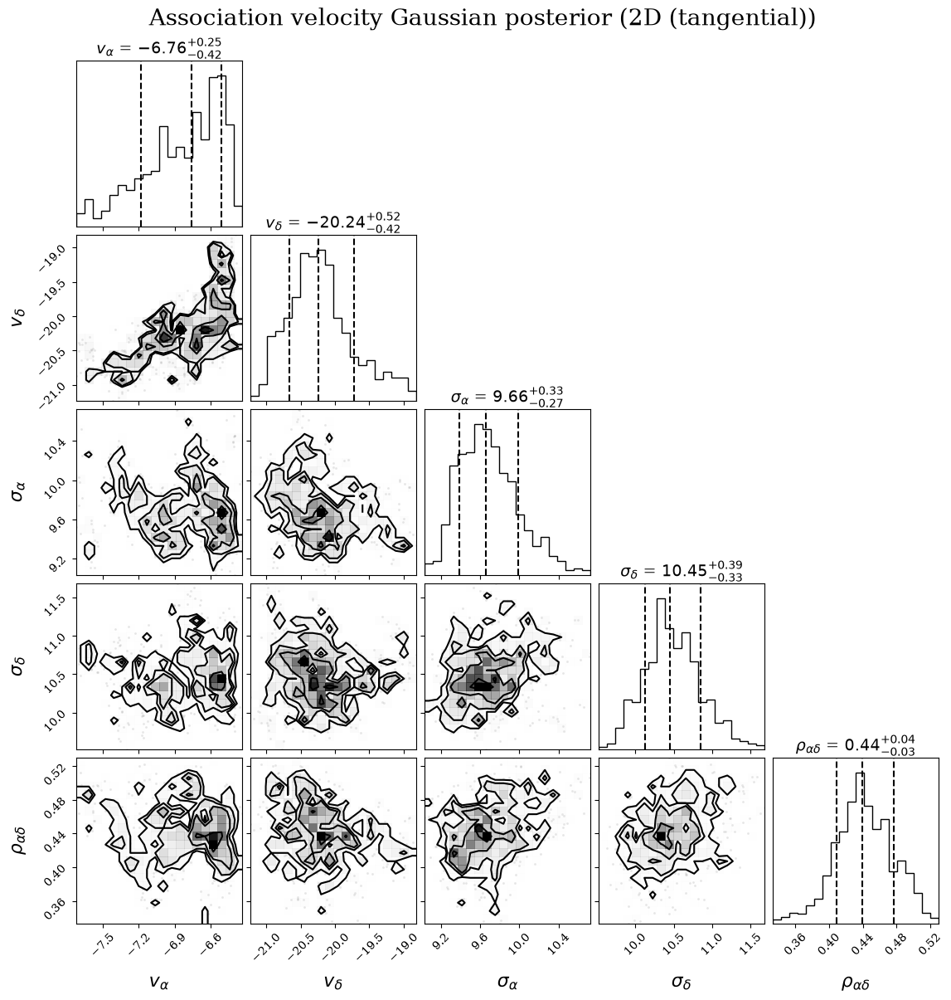

In [12]:
if result.velocity is None or "trace" not in result.velocity:
    print("No velocity corner: inference was skipped or no posterior trace.")
else:
    fig = result.plot_velocity_corner()
    #fig = display(result.plot_velocity_corner())

print()

## 5. Interactive 3D traceback

Positions are plotted as $(\alpha, \delta, 1/\varpi)$. Residual velocity arrows subtract the member-mean motion. The slider coasts at constant ICRS velocity, $r \to r - v t$, with $t$ in Myr and **no Galactic potential**. Stars without RV are coasted on tangential motion only ($v_r = 0$).

In [13]:
fig3d = result.plot_3d(traceback=(10, 0), n_frames=20)
fig3d

## 6. Save products

`AssociationResult.save` writes the membership table, a JSON summary, PNG diagnostics, and Plotly HTML. Independent RVs, if you have them, attach with `rv_path=` (see `examples/rvs_template.csv`); stars without a match still inform membership and the tangential dispersion.

In [14]:
saved = result.save(output_dir, traceback=(0, 10))
print(f"Wrote {saved.resolve()}\n")
for path in sorted(saved.iterdir()):
    print(f"  {path.name:28s}  {path.stat().st_size / 1024:8.1f} KB")

Wrote /home/rwillcox/astro/gaia_clustering/examples/results/algol

  association_3d.html             4147.5 KB
  membership.csv                   228.5 KB
  membership_corner.png            426.1 KB
  membership_summary.png           586.6 KB
  summary.json                       0.6 KB
  velocity_3d.html                 198.0 KB
  velocity_corner.png              528.0 KB
